# Fifa 21 Players Analysis

### Importing libraries

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore", category=SettingWithCopyWarning)

%matplotlib inline


NameError: name 'SettingWithCopyWarning' is not defined

### Reading the data

In [11]:
df=pd.read_csv("fifa21_male2.csv")
df.head()

C:\Users\User\AppData\Local\Temp\ipykernel_13248\4239370156.py:1: DtypeWarning: Columns (78) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("fifa21_male2.csv")


,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,...,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,...,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,...,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,...,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,...,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,...,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male


### Checking data types

In [10]:
df.dtypes

ID              int64
Name           object
Age             int64
OVA             int64
Nationality    object
                ...  
CB             object
RCB            object
RB             object
GK             object
Gender         object
Length: 107, dtype: object

In [12]:
df.shape

(17125, 107)

 ### Identifying null values

In [14]:
df.isnull().sum()

ID             0
Name           0
Age            0
OVA            0
Nationality    0
              ..
CB             0
RCB            0
RB             0
GK             0
Gender         0
Length: 107, dtype: int64

### Cleaning null values in the rows

In [15]:
df['Volleys'].replace({np.NaN:df['Volleys'].mean()},inplace=True)
df['Curve'].replace({np.NaN:df['Curve'].mean()},inplace=True)
df['Agility'].replace({np.NaN:df['Agility'].mean()},inplace=True)
df['Balance'].replace({np.NaN:df['Balance'].mean()},inplace=True)
df['Jumping'].replace({np.NaN:df['Jumping'].mean()},inplace=True)
df['Interceptions'].replace({np.NaN:df['Interceptions'].mean()},inplace=True)
df['Positioning'].replace({np.NaN:df['Positioning'].mean()},inplace=True)
df['Composure'].replace({np.NaN:df['Composure'].mean()},inplace=True)
df['Sliding Tackle'].replace({np.NaN:df['Sliding Tackle'].mean()},inplace=True)

In [19]:
# total count of players 
df.Name.nunique()

16176

### What is the nationwise participation in the Game?

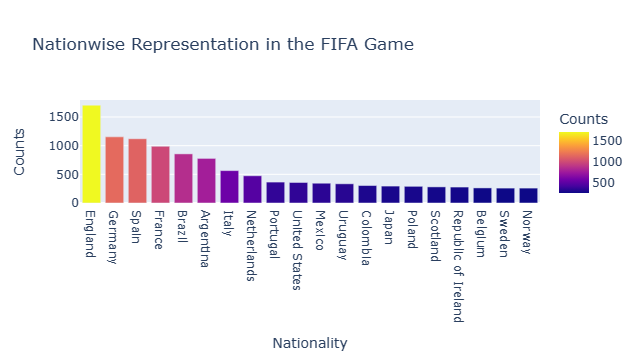

In [24]:
nat_cnt=df.groupby('Nationality').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
nat_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_nat_cnt=nat_cnt[:20]
fig=px.bar(top_20_nat_cnt,x='Nationality',y='Counts',color='Counts',title='Nationwise Representation in the FIFA Game')
fig.show()

### Which nation has the most number of overperforming players

We have selected nations with the  150 players to avoid biasness

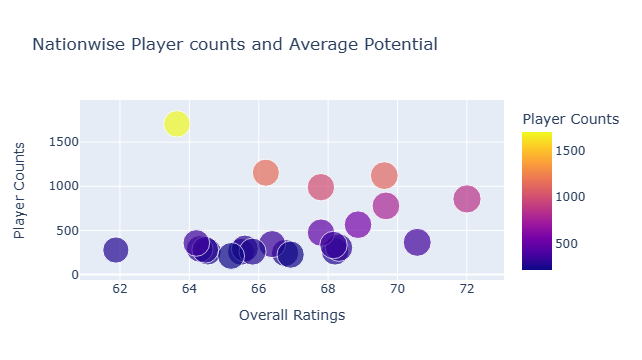

In [27]:
cnt_best_avg=df.groupby('Nationality').apply(lambda x:np.average(x['OVA'])).reset_index(name='Overall Ratings')
cnt_best_cnt=df.groupby('Nationality').apply(lambda x:x['OVA'].count()).reset_index(name='Player Counts')
snt_best_avg_cnt=pd.merge(cnt_best_avg,cnt_best_cnt,how='inner',left_on='Nationality',right_on='Nationality')
sel_best_avg_cnt=snt_best_avg_cnt[snt_best_avg_cnt['Player Counts']>=200]
sel_best_avg_cnt.sort_values(by=['Overall Ratings','Player Counts'],ascending=[False,False])
px.scatter(sel_best_avg_cnt,x='Overall Ratings',y='Player Counts',color='Player Counts',size='Overall Ratings',hover_data=['Nationality'],title='Nationwise Player counts and Average Potential')

England and Brazil are the teams that deserve a mention in this aspect. England since it has produced 1707 players, and still is having an average of 63.64, while Brazil has the highest average Ratings among the players

### What has been team wise Player Counts

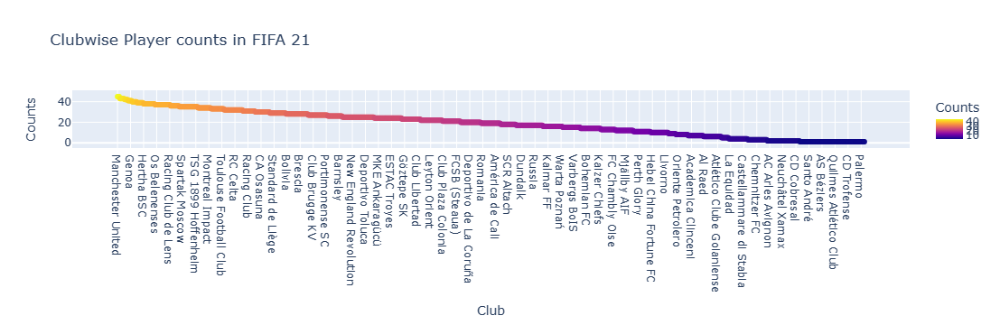

In [31]:
clb_cnt=df.groupby('Club').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
clb_cnt.sort_values(by='Counts',ascending=False,inplace=True)
fig=px.scatter(clb_cnt,x='Club',y='Counts',color='Counts',title='Clubwise Player counts in FIFA 21')
fig.show()

Chealsea and Manchester United have the most number of Players in record as a Club in FIFA 21- 45 players information for both the clubs. The average count of players for the English Premier League is more tHAN any other leage. This shows the prioritization of English football by FIFA

### Which teams have the most overperforming players

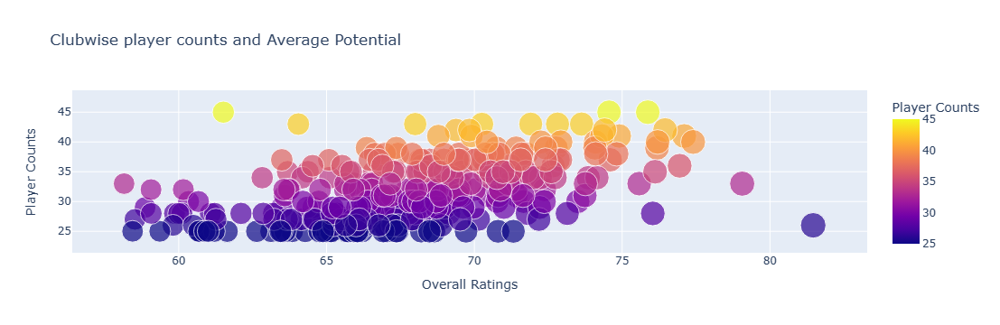

In [33]:
# selected teams with 25 players and above to avoid biassness
cnt_best_avg=df.groupby('Club').apply(lambda x:np.average(x['OVA'])).reset_index(name='Overall Ratings')
cnt_best_cnt=df.groupby('Club').apply(lambda x:x['OVA'].count()).reset_index(name='Player Counts')
snt_best_avg_cnt=pd.merge(cnt_best_avg,cnt_best_cnt,how='inner',left_on='Club',right_on='Club')
sel_best_avg_cnt=snt_best_avg_cnt[snt_best_avg_cnt['Player Counts']>=25]
sel_best_avg_cnt.sort_values(by=['Overall Ratings','Player Counts'],ascending=[False,False])
px.scatter(sel_best_avg_cnt,x='Overall Ratings',y='Player Counts',color='Player Counts',size='Overall Ratings',hover_data=['Club'],title='Clubwise player counts and Average Potential')

Bayern Munich has the highest average rating among all the teams (81.26) from a set of 26 players.Manchester United on the other hand has the highest average among the teams with 45players. They have an average of 75.866 on the 45 players

### What is the height and weight variation of the players

C:\Users\User\AppData\Local\Temp\ipykernel_13248\1694797537.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_13248\1694797537.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_13248\1694797537.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

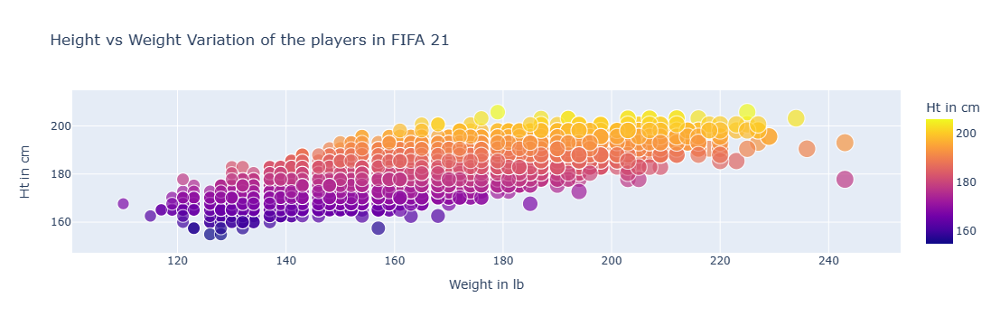

In [34]:
props=df[['Name','Nationality','Club','Height','Weight']]
props['Ht in ft']=pd.to_numeric(props['Height'].str[0])
props['Ht in in']=pd.to_numeric(props['Height'].str.split("\'").str[1].str.strip('"'))
props['Ht in cm']=(props['Ht in ft']*12+props['Ht in in'])*2.54
props['Weight in lb']=pd.to_numeric(props['Weight'].str.strip('lbs'))
fig=px.scatter(props,x='Weight in lb',y='Ht in cm',color='Ht in cm',size='Weight in lb',hover_data=['Name','Nationality','Club'],title='Height vs Weight Variation of the players in FIFA 21')
fig.show()

### Count of players position wise

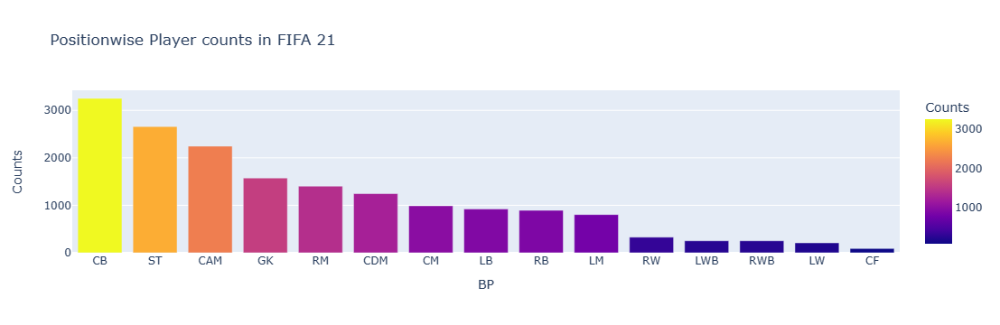

In [35]:
pos_cnt=df.groupby('BP').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
pos_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_pos_cnt=pos_cnt[:20]
fig=px.bar(top_20_pos_cnt,x='BP',y='Counts',color='Counts',title='Positionwise Player counts in FIFA 21')
fig.show()

We can see that most number of player population is for the Center Back Position, which is followed by Striker and The Central attacking midfielder positions

### What is the age Distribution of the players?

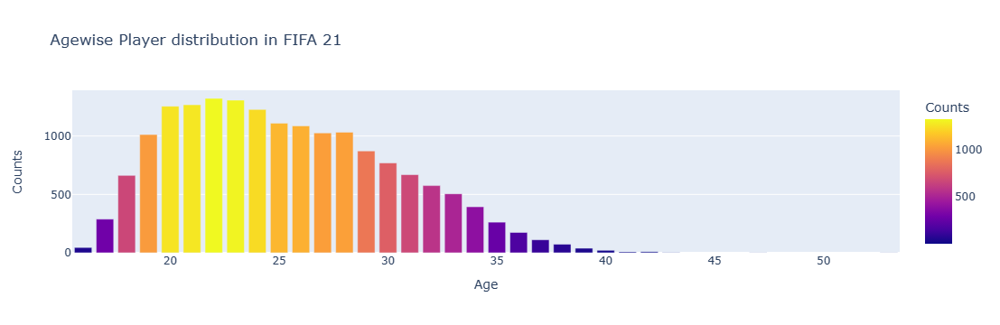

In [36]:
age_cnt=df.groupby('Age').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
fig=px.bar(age_cnt,x='Age',y='Counts',color='Counts',title='Agewise Player distribution in FIFA 21')
fig.show()

The chart resembles normal curve that is left skewed. 20-24 is the average age for most of the footballers in FIFA21

### What is the distibution of Market Value and Wage for the players?

C:\Users\User\AppData\Local\Temp\ipykernel_13248\4203064438.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_13248\4203064438.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_13248\4203064438.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

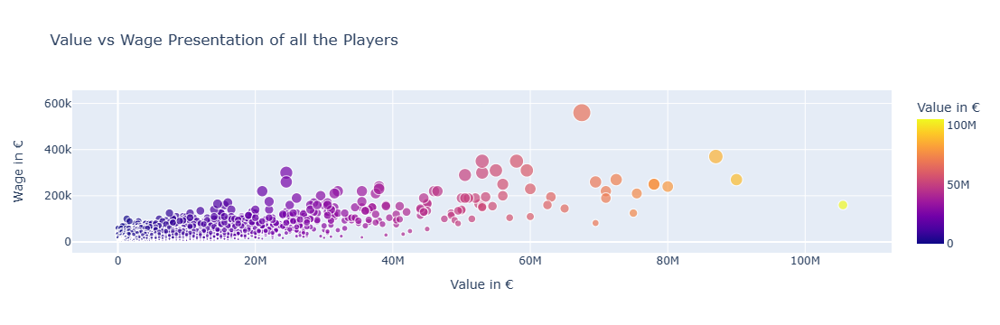

In [37]:
cost_prop= df[['Name','Club','Nationality','Wage','Value','BP']]
cost_prop['MultW']=np.where(cost_prop.Wage.str[-1]=='K',1000,1)
cost_prop['Wage']=cost_prop.Wage.str.strip('K')
cost_prop['Wage']=cost_prop.Wage.str.strip('€')
cost_prop['Wage']=pd.to_numeric(cost_prop['Wage'])
cost_prop['Wage in €']=cost_prop['Wage']*cost_prop['MultW']
cost_prop['MultV']=np.where(cost_prop.Value.str[-1]=='K',1000,np.where(cost_prop.Value.str[-1]=='M',1000000,1))
cost_prop['Value']=cost_prop.Value.str.strip('€')
cost_prop['Value']=cost_prop.Value.str.strip('K')
cost_prop['Value']=cost_prop.Value.str.strip('M')
cost_prop['Value']=pd.to_numeric(cost_prop['Value'])
cost_prop['Value in €']=cost_prop['Value']*cost_prop['MultV']
fig=px.scatter(cost_prop,x='Value in €',y='Wage in €',color='Value in €',size='Wage in €',hover_data=['Name','Club','Nationality','BP'],title='Value vs Wage Presentation of all the Players')
fig.show()